<h1 align=center><font size = 6>Applied Capstone Foursquare Final Project: Exploring data crime in neighbourhoods in Mexico City</font></h1>

## Introduction
In this project, the problem to be analyzed is exploring data crimes in Mexico City (aka CDMX).

After adjusting the set of data to be easier to work it, the Foursquare API will be used to explore the avenues and their categories and use this feature to group the neighbourhood into clusters.

Finally,it will be used the machine learning method K means clustering to get more information about neighbourhoods of interest.

## Table of Contents

* [Obtaining and Cleaning Dataset](#obtaining)

* [First statistical analysis and visualization](#first)

* [Using Foursquare API](#using)

* [Exploring neighbohoods](#exploring)

* [Machine Learning to the rescue](#machine)

* [Results and discussion](#results)

* [Conclusions](#conclusions)

Zero step: Getting the libraries that will be used along this script.

In [195]:
# Getting libraries

import pandas as pd # For reading and manipulating the set of data

import matplotlib as mpl # For visualizing data
import matplotlib.pyplot as plt #For visualizing data
import seaborn as sn # Correlation matrix

import geopandas as gpd #For reading GeoJSON files as dataframe

import folium #For doing maps

import json #For reading JSON files
import requests #For handling requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import numpy as np #For handling data in a vectorized manner
from sklearn.cluster import KMeans # import k-means from clustering stage
from sklearn import preprocessing # Preprocessind datta before machine learning methods

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

## 1. Obtaining and Cleaning Dataset <a name="obtaining"></a>

In order to get the crime data of CDMX, we have to take files of "Open Data Mexico City" (https://datos.cdmx.gob.mx/pages/home/).
In this cases the necessary files have been downloaded.

In [196]:
#Obtaining the raw data
df_raw = pd.read_csv('File path','carpetas-de-investigacion-pgj-de-la-ciudad-de-mexico.csv', low_memory=False) 

In [197]:
df_raw.head()

,ao_hechos,mes_hechos,fecha_hechos,delito,categoria_delito,fiscalia,agencia,unidad_investigacion,alcaldia_hechos,colonia_hechos,ao_inicio,mes_inicio,fecha_inicio,calle_hechos,calle_hechos2,longitud,latitud,geopoint
0,2017.0,Septiembre,2017-09-30 23:00:00,ROBO A NEGOCIO CON VIOLENCIA,ROBO A NEGOCIO CON VIOLENCIA,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2CD,CUAUHTEMOC,JUÁREZ,2017.0,Octubre,2017-10-01 00:12:26,VERSALLES Y MARSELLA,NaN,-99.155905,19.426970,"19.426970385,-99.1559051339"
1,2017.0,Septiembre,2017-09-30 22:00:00,DAÑO EN PROPIEDAD AJENA CULPOSA,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN GUSTAVO A. MADERO,GAM-2,UI-2CD,GUSTAVO A MADERO,RESIDENCIAL ACUEDUCTO DE GUADALUPE,2017.0,Octubre,2017-10-01 00:40:28,BRISAS,DESEMBOCADURA,-99.147345,19.525971,"19.5259710139,-99.1473450714"
2,2017.0,Agosto,2017-08-31 11:43:00,ROBO DE OBJETOS,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN IZTAPALAPA,IZP-4,UI-2SD,IZTAPALAPA,LEYES DE REFORMA 3A SECCIÓN,2017.0,Octubre,2017-10-01 00:47:11,GUERRA DE REFORMA,BATALLA DE CALPULALPAN,-99.068851,19.382600,"19.3825998321,-99.0688509212"
3,2017.0,Septiembre,2017-09-30 21:15:00,HOMICIDIO POR ARMA DE FUEGO,HOMICIDIO DOLOSO,INVESTIGACIÓN EN TLAHUAC,TLH-1,UI-2CD,TLAHUAC,LA HABANA,2017.0,Octubre,2017-10-01 00:47:53,MIGUEL HIDALGO,NaN,-98.996337,19.267774,"19.2677742376,-98.9963370068"
4,2017.0,Septiembre,2017-09-12 12:00:00,ABUSO DE CONFIANZA,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN IZTAPALAPA,IZP-4,UI-2SD,IZTAPALAPA,REAL DEL MORAL,2017.0,Octubre,2017-10-01 01:03:50,FERROCARRIL DE RIO FRIO,NaN,-99.080072,19.390447,"19.3904466893,-99.0800721114"


In [198]:
#Getting the information of raw dataframe
print("The dimensions of the raw data are: ", df_raw.shape)
#print("The information of types of data is: ", df_raw.info())

The dimensions of the raw data are:  (1005074, 18)


Cleaning data: In this stage, I will be kept only the major columns, and ordered the dataframe to get a neat and workable set of data.

In [199]:
#-------------------------------------IMPROVING DATAFRAME----------------------------------------------------#

#Quitting missing data
df_raw.dropna(inplace=True)

#For presentation, changing types
df_raw['ao_hechos'] = df_raw['ao_hechos'].astype('int32')

#Filtering by year
df_raw = df_raw[df_raw['ao_hechos']>=2010]

#Getting the numeric value of month and hour when the crime was done (for statistical purposes)
#To the the above thing,first I will transform 'fecha_hechos' of type datatime
df_raw['fecha_hechos'] = pd.to_datetime(df_raw['fecha_hechos'])

df_raw['Hour'] = df_raw['fecha_hechos'].dt.hour
df_raw['Month'] = df_raw['fecha_hechos'].dt.month #It will be keep as label encoding to analysis
df_raw['Weekday'] = df_raw['fecha_hechos'].dt.weekday #It will be keep as label encoding to analysis

In [200]:
#Renaming columns
df_raw.rename(columns =  {'ao_hechos': 'Year', 'delito':'Crime', 'alcaldia_hechos':'Borough', \
'colonia_hechos':'Neighbourhood', 'longitud':'Longitude', 'latitud':'Latitude', \
'categoria_delito':'Category of crime'}, inplace = True)

#Creating another dataframe
df_neat = df_raw[['Year', 'Category of crime','Crime','Weekday', 'Hour', 'Month', 'Borough', 'Neighbourhood', 'Longitude', 'Latitude']].copy()

#Resetting the index
df_neat.reset_index(drop=True, inplace=True)
                   
#With the modifications
print("The information of the modified data is: ",df_neat.shape) 
print("The information of types of modified data is: ", df_neat.info())
df_neat.head() 

The information of the modified data is:  (382209, 10)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382209 entries, 0 to 382208
Data columns (total 10 columns):
Year                 382209 non-null int32
Category of crime    382209 non-null object
Crime                382209 non-null object
Weekday              382209 non-null int64
Hour                 382209 non-null int64
Month                382209 non-null int64
Borough              382209 non-null object
Neighbourhood        382209 non-null object
Longitude            382209 non-null float64
Latitude             382209 non-null float64
dtypes: float64(2), int32(1), int64(3), object(4)
memory usage: 27.7+ MB
The information of types of modified data is:  None


,Year,Category of crime,Crime,Weekday,Hour,Month,Borough,Neighbourhood,Longitude,Latitude
0,2017,DELITO DE BAJO IMPACTO,DAÑO EN PROPIEDAD AJENA CULPOSA,5,22,9,GUSTAVO A MADERO,RESIDENCIAL ACUEDUCTO DE GUADALUPE,-99.147345,19.525971
1,2017,DELITO DE BAJO IMPACTO,ROBO DE OBJETOS,3,11,8,IZTAPALAPA,LEYES DE REFORMA 3A SECCIÓN,-99.068851,19.382600
2,2017,DELITO DE BAJO IMPACTO,NEGACION DEL SERVICIO PUBLICO,0,18,9,MIGUEL HIDALGO,PENSIL NORTE,-99.194735,19.449537
3,2017,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,ROBO DE VEHICULO DE SERVICIO PARTICULAR CON VI...,5,21,9,LA MAGDALENA CONTRERAS,LA CARBONERA,-99.251043,19.301686
4,2017,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,ROBO DE VEHICULO DE SERVICIO PÚBLICO SIN VIOLE...,5,22,9,IZTAPALAPA,PASEOS DE CHURUBUSCO,-99.087495,19.384309


## 2. First statistical analysis and visualization <a name="first"></a>

In this stage, it will be tested the popular wisdom about streets as "It is more probably been a victim of a crime at evening than noon" or "There are more crimes on Friday and weekends", "The end of the year is more dangerous", things like that.

It will be done a few mini-dataframes and it will be plotted some bar graphics. To keep this part simple, the nature of crimes will be not considered.

- Searching a relatioship between the hour of crimes and quantity of them.

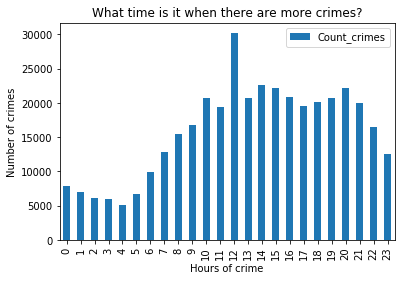

In [201]:
w = df_neat['Hour'].value_counts()
w1 = w.to_dict() #converts to dictionary
df_cri_hr = pd.DataFrame.from_dict(w1, orient='index')
df_cri_hr.reset_index(inplace=True)
df_cri_hr.rename(columns = {'index':'Hours of crime', 0:'Count_crimes'}, inplace = True)
df_cri_hr.reset_index(drop=True)
df_cri_hr.sort_values(by='Hours of crime', inplace=True)
#df_cri_hr

#Plotting data
ax = df_cri_hr.plot.bar(x='Hours of crime')
ax.set_ylabel('Number of crimes')
ax.set_title('What time is it when there are more crimes?')
plt.show()

From the above bars, it can be noted that the hour with most crimes is maybe surprisengly at noon. It can be infered that there is no safe hour.

- Searching a relatioship between the weekday of crimes and quantity of them.

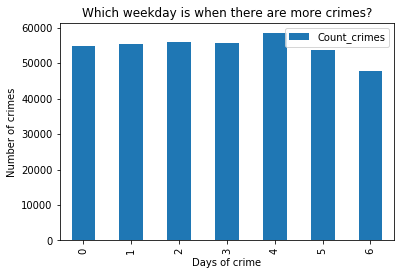

In [202]:
v = df_neat['Weekday'].value_counts()
v1 = v.to_dict() #converts to dictionary
df_cri_day = pd.DataFrame.from_dict(v1, orient='index')
df_cri_day.reset_index(inplace=True)
df_cri_day.rename(columns = {'index':'Days of crime', 0:'Count_crimes'}, inplace = True)
df_cri_day.reset_index(drop=True)
df_cri_day.sort_values(by='Days of crime', inplace=True)
#df_cri_day

#Plotting data
ax = df_cri_day.plot.bar(x='Days of crime')
ax.set_ylabel('Number of crimes')
ax.set_title('Which weekday is when there are more crimes?')
plt.show()

Considering that Monday = 0, Thursday = 1, ..., Sunday = 6, in this case popular wisdom is right, the day with more crimes comitted is Friday.

- Searching a relatioship between the month of crimes and quantity of them.

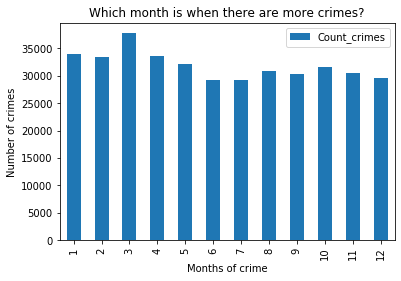

In [203]:
t = df_neat['Month'].value_counts()
t1 = t.to_dict() #converts to dictionary
df_cri_mth = pd.DataFrame.from_dict(t1, orient='index')
df_cri_mth.reset_index(inplace=True)
df_cri_mth.rename(columns = {'index':'Months of crime', 0:'Count_crimes'}, inplace = True)
df_cri_mth.reset_index(drop=True)
df_cri_mth.sort_values(by='Months of crime', inplace=True)
#df_cri_day

#Plotting data
ax = df_cri_mth.plot.bar(x='Months of crime')
ax.set_ylabel('Number of crimes')
ax.set_title('Which month is when there are more crimes?')
plt.show()

It can be observed that the most dangerous mouth is March, but it can not given any cause.

- Searching a relatioship between the year of crimes of the decade.

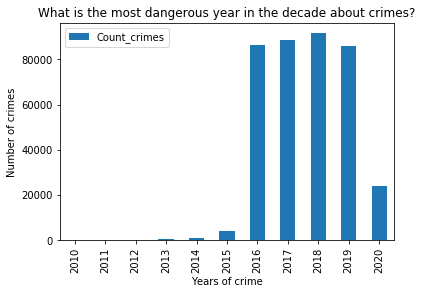

In [204]:
q = df_neat['Year'].value_counts()
q1 = q.to_dict() #converts to dictionary
df_cri_yr = pd.DataFrame.from_dict(q1, orient='index')
df_cri_yr.reset_index(inplace=True)
df_cri_yr.rename(columns = {'index':'Years of crime', 0:'Count_crimes'}, inplace = True)
df_cri_yr.reset_index(drop=True)
df_cri_yr.sort_values(by='Years of crime', inplace=True)
#df_cri_yr

#Plotting data
ax = df_cri_yr.plot.bar(x='Years of crime')
ax.set_ylabel('Number of crimes')
ax.set_title('What is the most dangerous year in the decade about crimes?')
plt.show()

The most dangerous year in CDMX was 2018. And there is a remarkable increase of crimes from 2015 to 2016 (or at least, complaints of them). How it would be in the end od 2020? 

- Applying descriptive statitics to the dataframe with for the purpose of discover any relationship.

In [205]:
df_neat.describe()

,Year,Weekday,Hour,Month,Longitude,Latitude
count,382209.000000,382209.000000,382209.000000,382209.000000,382209.000000,382209.000000
mean,2017.609130,2.941338,13.482223,6.319757,-99.131079,19.392410
std,1.303127,1.963928,5.869796,3.473262,0.057032,0.069771
min,2010.000000,0.000000,0.000000,1.000000,-99.342765,19.095354
25%,2017.000000,1.000000,10.000000,3.000000,-99.167535,19.345396
50%,2018.000000,3.000000,14.000000,6.000000,-99.136260,19.395860
75%,2019.000000,5.000000,18.000000,9.000000,-99.095710,19.443462
max,2020.000000,6.000000,23.000000,12.000000,-98.947609,19.582490


The descriptive statistics after the above plots is... Practically useless (it does not tell anything new), due to it will be used Pearson's correlation to search relationships between the variables.

- Applying Pearson correlation to the dataframe with for the purpose of discover any relationship.

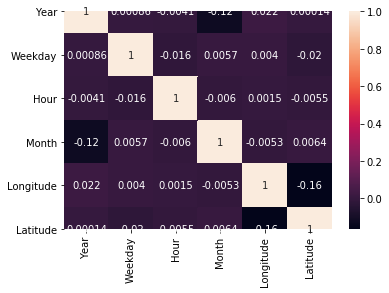

In [206]:
corrMatrix = df_neat.corr()
sn.heatmap(corrMatrix, annot=True)

It has been seen that the variables that could be decisive to be a victim of a crime, does not have a correlation of any type, so the correlation matrix is not conclusive. The statistical analysis does not give results.

- It is time to go the geographic feature. It will be showed the projection of crimes on a map of CDMX's boroughs.

In [207]:
#Getting the geojson file of CDMX's boroughs to create a map
cdmx_bor = gpd.read_file('File path','alcaldias.geojson')
#cdmx_bor

Creating a minidataframe of the crimes per borough for creating a map

In [208]:
z = df_neat['Borough'].value_counts()
z1 = z.to_dict() #converts to dictionary
df_cri_bor = pd.DataFrame.from_dict(z1, orient='index') 
df_cri_bor.reset_index(inplace=True)
df_cri_bor.rename(columns = {'index':'Borough', 0:'Count_crimes'}, inplace = True)
df_cri_bor['Borough'] = df_cri_bor['Borough'].str.title()
df_cri_bor.replace(to_replace=['Cuauhtemoc','Juarez','Coyoacan','Alvaro','Obregon','Tlahuac', 'Gustavo A Madero'],
               value= ['Cuauhtémoc', 'Juárez', 'Coyoacán','Álvaro', 'Obregón', 'Tláhuac', 'Gustavo A. Madero'],
               inplace = True)
#df_cri_bor

In [209]:
#Creating a map

#Giving latitude and longitude values (in this case CDMX)
latitude = 19.42847
longitude = -99.12766 

cdmxmap_crim = folium.Map(location=[latitude, longitude], zoom_start=10)

cdmxmap_crim.choropleth(
    geo_data=cdmx_bor,
    data=df_cri_bor,
    columns=['Borough', 'Count_crimes'],
    key_on='feature.properties.nomgeo', #The name of the column of borough in geojson file is the key, "nomgeo.
                                        #Note for other rookies: In case of another languages the values of the 
                                        #dataframe have to match exactly with the geojson file, including 
                                        #capital/lower letters, accents, dots, etc. 
                                        #Otherwise the values of the distribution does not execute correctly.
    fill_color='YlGnBu',  
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Distribution criminal acts in Mexico City'
    )
# display map
cdmxmap_crim

What on Earth?! CDMX its really big, isn't it? A priori, from this map, it can be infered that CDMX's north-east region is the most dangeorus.

### Studying a region with the most interest.

Because of CDMX it is really big, and optimizing computational performance, it will be studied deeper the most dangerous borough, "Cuauhtemoc", so it will be created a dataframe only about that borough.

In [210]:
#Getting 
df_cuauh_crimes = df_neat[df_neat['Borough'] == 'CUAUHTEMOC']
df_cuauh_crimes = df_cuauh_crimes.reset_index(drop=True)
df_cuauh_crimes.head()
print(df_cuauh_crimes.shape)

(59774, 10)


*Note: After a lot of attempts in a posterior stage with folium, I discovered that does not work with a considerable number of cases, I kept crimes only of 2020, observed the computational efford to work with ~60000 crimes originally vs ~4000 correspondent to a one year.*

In [211]:
cuauhtemoc_neat = df_cuauh_crimes[df_cuauh_crimes['Year']==2020].reset_index(drop = True)
print(cuauhtemoc_neat.shape)
#cuauhtemoc_neat.head()

(3385, 10)


- Plotting the crimes in the borough 'Cuauhtemoc' in 2020

In [212]:
#Creating map of Toronto using latitude and longitude values
map_cuauhtemoc = folium.Map(location=[latitude, longitude], zoom_start=12.5)

# add markers to map
for lat, lng, borough, neighborhood in zip(cuauhtemoc_neat['Latitude'], cuauhtemoc_neat['Longitude'], cuauhtemoc_neat['Borough'], cuauhtemoc_neat['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_cuauhtemoc)  
    
map_cuauhtemoc

The above dataframe will be useful after. 

## 3. Using Foursquare API <a name="using"></a>

It is time to use the city dynamics. In this case them will be used some venues and their categories, these offer other changes in the features of the crimes.

- Preparing the data to use Foursquare

In [213]:
#Getting only a geographic dataframe
df_cuauh_geo = df_cuauh_crimes[['Neighbourhood','Latitude','Longitude']]
df_cuauh_geo = df_cuauh_geo.drop_duplicates('Neighbourhood').reset_index(drop=True)
df_cuauh_geo.head()

,Neighbourhood,Latitude,Longitude
0,CENTRO,19.423283,-99.128355
1,ROMA NORTE,19.423836,-99.161182
2,SANTA MARIA LA RIBERA,19.440888,-99.157755
3,PERALVILLO,19.458507,-99.132219
4,BUENAVISTA,19.444482,-99.153819


- Defining Foursquare Credentials and Version

In [214]:
CLIENT_ID = 'OH2KKU0A1GZ0EUQCWPGTO4QWRDH5S0H4KOFZODTIZ4GT2N2L' # your Foursquare ID
CLIENT_SECRET = 'K11EF02VWGIA5JSZIJTK3TLH0GD0URXLW3MWBMHHLMEB4V5T' # your Foursquare Secret
VERSION = '20200619' # Foursquare API parameter v=YYYYMMDD
LIMIT = 30
ACCESS_TOKEN = 'R3QHWJ1XJMVHEK01JY55UMZQ4FLPLOQGFPDO22Z4344ZPTBJ'
radius = 500

After a few toy attempts with Foursquare I have reached a these conclusions: Is better to work with the API when the dataframe does not have repeated values.

It will be replicated the process in the lab of "Battle of Neighbourhoods" in a loop
    1. Creating the url
    2. Sending the GET request and examine the results
    3. The information is given in *items* key. It willbe used a function that gives the type of venues
    4. Cleaning JSON file and putting in pandas dataframe

Defining a function

In [215]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [216]:
cuauh_neigh_venues = getNearbyVenues(names=df_cuauh_geo['Neighbourhood'],
                                   latitudes=df_cuauh_geo['Latitude'],
                                   longitudes=df_cuauh_geo['Longitude']
                                  )

CENTRO
ROMA NORTE
SANTA MARIA LA RIBERA
PERALVILLO
BUENAVISTA
VISTA ALEGRE
CUAUHTÉMOC
NONOALCO TLATELOLCO
TABACALERA
JUÁREZ
MAZA
GUERRERO
ATLAMPA
MORELOS
DOCTORES
HIPÓDROMO
OBRERA
CONDESA
PAULINO NAVARRO
VALLE GÓMEZ
SANTA MARIA INSURGENTES
ROMA SUR
SAN RAFAEL
ALGARIN
AMPLIACIÓN ASTURIAS
BUENOS AIRES
EX-HIPÓDROMO DE PERALVILLO
SAN SIMÓN TOLNAHUAC
ASTURIAS
ESPERANZA
TRANSITO
HIPÓDROMO CONDESA
CENTRO URBANO BENITO JUÁREZ
FELIPE PESCADOR
ZONA CENTRO
TLATILCO


Getting the dataframe with the neighbourhood's venues and their categories

In [217]:
print('The dimensions of this dataframe are: ',cuauh_neigh_venues.shape)
cuauh_neigh_venues.head()

The dimensions of this dataframe are:  (980, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,CENTRO,19.423283,-99.128355,Atea,19.424974,-99.128190,Art Gallery
1,CENTRO,19.423283,-99.128355,Lemur Room,19.423292,-99.128714,Rock Club
2,CENTRO,19.423283,-99.128355,316Centro,19.423381,-99.128650,Music Venue
3,CENTRO,19.423283,-99.128355,Pulqueria la Elegante,19.423499,-99.128610,Brewery
4,CENTRO,19.423283,-99.128355,Gym Charles Bronson,19.420984,-99.129520,Gym


Optional: Checking how many venues were returned for each neighborhood and see the are the unique values

In [218]:
#cuauh_neigh_venues.groupby('Neighbourhood').count()
#print('There are {} uniques categories.'.format(len(cuauh_neigh_venues['Venue Category'].unique())))

# 4. Exploring neighbourhoods <a name="exploring"></a>

- In this part, the purpose for exploring neighbourhood is to get other geographic short-changing feature that, gives other standpoint, i.e. the categories of places in the venues. It means, for example, "Where is easier been a victim of a robbery, in a street market, in a food stand, or a formal restaurant?

In [219]:
# one hot encoding
cuauhtemoc_onehot = pd.get_dummies(cuauh_neigh_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
cuauhtemoc_onehot['Neighbourhood'] = cuauh_neigh_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [cuauhtemoc_onehot.columns[-1]] + list(cuauhtemoc_onehot.columns[:-1])
cuauhtemoc_onehot = cuauhtemoc_onehot[fixed_columns]

cuauhtemoc_onehot.head()

,Neighbourhood,Advertising Agency,Airport,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,...,Turkish Restaurant,Vegetarian / Vegan Restaurant,Veterinarian,Video Game Store,Video Store,Warehouse Store,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,CENTRO,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,CENTRO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,CENTRO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,CENTRO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,CENTRO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**The above dataframe it the ideal data to use in a machine learning methods selected here.**

Other useful steps applied to the data are here as a big comment, if you want another ways of exploring!

In [220]:
# Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category
cuauhtemoc_grouped = cuauhtemoc_onehot.groupby('Neighbourhood').mean().reset_index()
cuauhtemoc_grouped.head()  #cuauhtemoc_grouped.shape

,Neighbourhood,Advertising Agency,Airport,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,...,Turkish Restaurant,Vegetarian / Vegan Restaurant,Veterinarian,Video Game Store,Video Store,Warehouse Store,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,ALGARIN,0.043478,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,AMPLIACIÓN ASTURIAS,0.000000,0.0,0.0,0.0,0.066667,0.000000,0.0,0.0,0.0,...,0.0,0.033333,0.0,0.033333,0.0,0.0,0.0,0.0,0.0,0.0
2,ASTURIAS,0.000000,0.0,0.0,0.0,0.040000,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,ATLAMPA,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,BUENAVISTA,0.000000,0.0,0.0,0.0,0.000000,0.033333,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [221]:
# Let's print each neighborhood along with the top 10 most common venues
num_top_venues = 10

for hood in cuauhtemoc_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = cuauhtemoc_grouped[cuauhtemoc_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ALGARIN----
                           venue  freq
0             Mexican Restaurant  0.22
1                     Taco Place  0.17
2                         Bakery  0.13
3             Advertising Agency  0.04
4                   Dance Studio  0.04
5             Seafood Restaurant  0.04
6                    Coffee Shop  0.04
7                     Food Truck  0.04
8  Paper / Office Supplies Store  0.04
9            Sporting Goods Shop  0.04


----AMPLIACIÓN ASTURIAS----
                    venue  freq
0      Mexican Restaurant  0.13
1          Ice Cream Shop  0.07
2                  Bakery  0.07
3  Argentinian Restaurant  0.07
4            Dessert Shop  0.07
5                    Café  0.07
6              Print Shop  0.07
7              Taco Place  0.03
8               Gift Shop  0.03
9     Sporting Goods Shop  0.03


----ASTURIAS----
                  venue  freq
0    Mexican Restaurant  0.36
1                   Bar  0.12
2                Market  0.04
3           Flower Shop  0.04
4   

                 venue  freq
0   Mexican Restaurant  0.47
1           Taco Place  0.10
2   Seafood Restaurant  0.07
3  Arts & Crafts Store  0.07
4       Farmers Market  0.03
5                  Bar  0.03
6                  Gym  0.03
7       Sandwich Place  0.03
8                Hotel  0.03
9             Pharmacy  0.03


----ROMA NORTE----
                  venue  freq
0                Bakery  0.10
1    Seafood Restaurant  0.07
2           Art Gallery  0.07
3      Asian Restaurant  0.07
4           Candy Store  0.03
5            Taco Place  0.03
6        Breakfast Spot  0.03
7      Sushi Restaurant  0.03
8           Supermarket  0.03
9  Gym / Fitness Center  0.03


----ROMA SUR----
                 venue  freq
0        Jewelry Store  0.07
1             Boutique  0.07
2           Donut Shop  0.07
3  Sporting Goods Shop  0.07
4   Mexican Restaurant  0.07
5          Men's Store  0.03
6     Department Store  0.03
7       Cosmetics Shop  0.03
8   Seafood Restaurant  0.03
9           Taco Plac

In [222]:
# Let's put that into a *pandas* dataframe

# First, let's write a function to sort the venues in descending order.
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
   
    return row_categories_sorted.index.values[0:num_top_venues]

# Now let's create the new dataframe and display the top 5 venues for each neighborhood.
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhood'] = cuauhtemoc_grouped['Neighbourhood']

for ind in np.arange(cuauhtemoc_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(cuauhtemoc_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALGARIN,Mexican Restaurant,Taco Place,Bakery,Advertising Agency,Coffee Shop,Paper / Office Supplies Store,Seafood Restaurant,Brewery,Food Truck,Steakhouse
1,AMPLIACIÓN ASTURIAS,Mexican Restaurant,Bakery,Argentinian Restaurant,Print Shop,Dessert Shop,Café,Ice Cream Shop,Video Game Store,Coffee Shop,Bed & Breakfast
2,ASTURIAS,Mexican Restaurant,Bar,Bakery,Liquor Store,Latin American Restaurant,Music Venue,Market,Martial Arts Dojo,Flower Shop,Grocery Store
3,ATLAMPA,Restaurant,Taco Place,Park,Mexican Restaurant,Food Truck,Coffee Shop,Burger Joint,Candy Store,Bakery,Bridge
4,BUENAVISTA,Mexican Restaurant,Dessert Shop,Ice Cream Shop,Coffee Shop,Japanese Restaurant,Garden,Burger Joint,Museum,Brewery,Mediterranean Restaurant


# 5. Machine learning to the rescue <a name="obtaining"></a>

**The machine learning chosen is K means Clustering, because is an unsupervised method and this work is about exploring data, not making predictions. Also there is not a "true dataset" to try train phase a methods as supervised learning.**

### K means Clustering

- Defining clusters: To this stage, I have been playing with the number on clusters and project them on a map, according to this, the best number of cluster is 4 because of the clusters look well defined.

In [223]:
# set number of clusters
kclusters = 4

cuauhtemoc_grouped_clustering = cuauhtemoc_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(cuauhtemoc_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 3, 0, 1, 3, 3, 3, 3, 2, 3], dtype=int32)

- Creating a new dataframe that includes the cluster as well as the top 10 venues for each neighbourhood.

In [224]:
# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [225]:
cuauhtemoc_merged = cuauhtemoc_neat.reset_index(drop=True)

# merge cuauhtemoc_grouped with cuauhtemoc_veanues to add latitude/longitude for each neighborhood
cuauhtemoc_merged = cuauhtemoc_merged.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')
cuauhtemoc_merged.head() # check the last columns!

,Year,Category of crime,Crime,Weekday,Hour,Month,Borough,Neighbourhood,Longitude,Latitude,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2020,DELITO DE BAJO IMPACTO,CORRUPCIÓN DE PERSONAS MENORES DE EDAD O PERSO...,4,19,3,CUAUHTEMOC,PERALVILLO,-99.127369,19.459069,...,Mexican Restaurant,Taco Place,Seafood Restaurant,Arts & Crafts Store,Bar,Pharmacy,Coffee Shop,Sandwich Place,Farmers Market,Food & Drink Shop
1,2020,DELITO DE BAJO IMPACTO,ROBO DE OBJETOS,5,3,3,CUAUHTEMOC,CENTRO,-99.140254,19.437768,...,Coffee Shop,Taco Place,Seafood Restaurant,Gym / Fitness Center,Market,Mexican Restaurant,Rock Club,Burger Joint,Music Venue,Brewery
2,2020,ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON ...,ROBO A TRANSEUNTE SALIENDO DEL CAJERO CON VIOL...,4,21,3,CUAUHTEMOC,DOCTORES,-99.153257,19.425487,...,Mexican Restaurant,Bar,Bakery,Restaurant,Sushi Restaurant,Taco Place,Pub,Pharmacy,College Administrative Building,Park
3,2020,DELITO DE BAJO IMPACTO,LESIONES CULPOSAS POR TRANSITO VEHICULAR,5,11,3,CUAUHTEMOC,MORELOS,-99.138598,19.443968,...,Taco Place,Mexican Restaurant,Flea Market,Bar,Brewery,Spanish Restaurant,Soccer Stadium,Market,French Restaurant,Sporting Goods Shop
4,2020,DELITO DE BAJO IMPACTO,ROBO DE ACCESORIOS DE AUTO,5,9,3,CUAUHTEMOC,CONDESA,-99.178706,19.413465,...,Ice Cream Shop,Taco Place,Café,Park,Yoga Studio,Coffee Shop,Seafood Restaurant,Sandwich Place,Salon / Barbershop,Chinese Restaurant


- Visualizing the clusters

In [226]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12.5)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cuauhtemoc_merged['Latitude'], cuauhtemoc_merged['Longitude'], cuauhtemoc_merged['Neighbourhood'], cuauhtemoc_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### Trial and error re-Clustering

In [227]:
# set number of clusters
kclusters2 = 6

cuauhtemoc_grouped_clustering2 = cuauhtemoc_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans2 = KMeans(n_clusters=kclusters2, random_state=0).fit(cuauhtemoc_grouped_clustering2)

# check cluster labels generated for each row in the dataframe
kmeans2.labels_[0:10] 

array([4, 1, 2, 3, 1, 1, 1, 1, 1, 1], dtype=int32)

In [228]:
# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels2', kmeans2.labels_)

cuauhtemoc_merged2 =cuauhtemoc_neat.reset_index(drop=True)

# merge cuauhtemoc_grouped with cuauhtemoc_veanues to add latitude/longitude for each neighborhood
cuauhtemoc_merged2 = cuauhtemoc_merged2.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')

cuauhtemoc_merged2.head() # check the last columns!

,Year,Category of crime,Crime,Weekday,Hour,Month,Borough,Neighbourhood,Longitude,Latitude,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2020,DELITO DE BAJO IMPACTO,CORRUPCIÓN DE PERSONAS MENORES DE EDAD O PERSO...,4,19,3,CUAUHTEMOC,PERALVILLO,-99.127369,19.459069,...,Mexican Restaurant,Taco Place,Seafood Restaurant,Arts & Crafts Store,Bar,Pharmacy,Coffee Shop,Sandwich Place,Farmers Market,Food & Drink Shop
1,2020,DELITO DE BAJO IMPACTO,ROBO DE OBJETOS,5,3,3,CUAUHTEMOC,CENTRO,-99.140254,19.437768,...,Coffee Shop,Taco Place,Seafood Restaurant,Gym / Fitness Center,Market,Mexican Restaurant,Rock Club,Burger Joint,Music Venue,Brewery
2,2020,ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON ...,ROBO A TRANSEUNTE SALIENDO DEL CAJERO CON VIOL...,4,21,3,CUAUHTEMOC,DOCTORES,-99.153257,19.425487,...,Mexican Restaurant,Bar,Bakery,Restaurant,Sushi Restaurant,Taco Place,Pub,Pharmacy,College Administrative Building,Park
3,2020,DELITO DE BAJO IMPACTO,LESIONES CULPOSAS POR TRANSITO VEHICULAR,5,11,3,CUAUHTEMOC,MORELOS,-99.138598,19.443968,...,Taco Place,Mexican Restaurant,Flea Market,Bar,Brewery,Spanish Restaurant,Soccer Stadium,Market,French Restaurant,Sporting Goods Shop
4,2020,DELITO DE BAJO IMPACTO,ROBO DE ACCESORIOS DE AUTO,5,9,3,CUAUHTEMOC,CONDESA,-99.178706,19.413465,...,Ice Cream Shop,Taco Place,Café,Park,Yoga Studio,Coffee Shop,Seafood Restaurant,Sandwich Place,Salon / Barbershop,Chinese Restaurant


In [229]:
# create map
map_clusters2 = folium.Map(location=[latitude, longitude], zoom_start=12.5)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters2)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cuauhtemoc_merged2['Latitude'], cuauhtemoc_merged2['Longitude'], cuauhtemoc_merged2['Neighbourhood'], cuauhtemoc_merged2['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters2)
       
map_clusters2

### Optimal k?

Apparently even k has been 4 and 6 in the maps, there is not a difference, so which one is the optimal k?

- Making an appeal to "Elbow method" in our help

*Important note!! Do not forget that K means Clustering was chosen on first place because is an unsupervised method of machine learning and does not need labels as supervised methods, so the features are only numerical variables in our dataframe.*

In [230]:
#Setting the features 
X = cuauhtemoc_neat[['Weekday','Hour','Month','Longitude','Latitude']] #also Year, but in this case is only 2020

#Normalizing
X = preprocessing.StandardScaler().fit(X).transform(X)

In [231]:
#Finding the best k
k = 15

inertia=[]

for n in range(1,k):
    kmeans = KMeans(n_clusters=n, random_state=0).fit(X)
    inertia.append(kmeans.inertia_)

inertia

[16925.0,
 13554.202580634314,
 11366.051696806191,
 9842.405929851591,
 8877.779719738619,
 8166.969278054482,
 7620.998577617423,
 7195.786482667783,
 6831.244688317144,
 6492.592235256037,
 6209.712341093141,
 5958.539490082119,
 5757.12586041276,
 5575.997613779954]

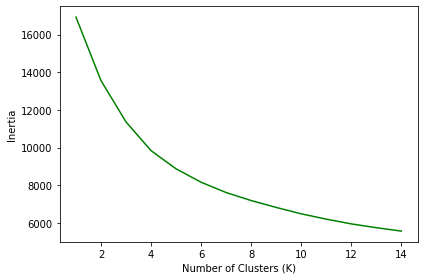

In [232]:
plt.plot(range(1,Ks),inertia,'g')
plt.ylabel('Inertia')
plt.xlabel('Number of Clusters (K)')
plt.tight_layout()
plt.show()

**The inertia is measure of how internally coherent clusters are. Observe that "the knee of the curve" is 4.**

# 6. Results and discussion <a name="results"></a>

### Examining Clusters

#### Cluster 1

In [233]:
cluster_one = cuauhtemoc_merged.loc[cuauhtemoc_merged['Cluster Labels'] == 0, cuauhtemoc_merged.columns[[1] + list(range(5, cuauhtemoc_merged.shape[1]))]]
cluster_one.head()

,Category of crime,Month,Borough,Neighbourhood,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,PERALVILLO,-99.127369,19.459069,0,Mexican Restaurant,Taco Place,Seafood Restaurant,Arts & Crafts Store,Bar,Pharmacy,Coffee Shop,Sandwich Place,Farmers Market,Food & Drink Shop
2,ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON ...,3,CUAUHTEMOC,DOCTORES,-99.153257,19.425487,0,Mexican Restaurant,Bar,Bakery,Restaurant,Sushi Restaurant,Taco Place,Pub,Pharmacy,College Administrative Building,Park
7,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,PERALVILLO,-99.130497,19.457995,0,Mexican Restaurant,Taco Place,Seafood Restaurant,Arts & Crafts Store,Bar,Pharmacy,Coffee Shop,Sandwich Place,Farmers Market,Food & Drink Shop
15,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,3,CUAUHTEMOC,DOCTORES,-99.153941,19.420612,0,Mexican Restaurant,Bar,Bakery,Restaurant,Sushi Restaurant,Taco Place,Pub,Pharmacy,College Administrative Building,Park
19,VIOLACIÓN,3,CUAUHTEMOC,GUERRERO,-99.141770,19.438549,0,Mexican Restaurant,Taco Place,Brewery,Bar,Antique Shop,Beer Garden,Snack Place,Plaza,Grocery Store,College & University


In [234]:
cluster_one['Neighbourhood'].value_counts()

GUERRERO                      228
DOCTORES                      214
SANTA MARIA LA RIBERA         113
PERALVILLO                     66
EX-HIPÓDROMO DE PERALVILLO     51
ALGARIN                        16
ASTURIAS                       12
PAULINO NAVARRO                 9
Name: Neighbourhood, dtype: int64

In [235]:
cluster_one['Category of crime'].value_counts()

DELITO DE BAJO IMPACTO                                     566
ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA        50
ROBO DE VEHÍCULO CON Y SIN VIOLENCIA                        26
HECHO NO DELICTIVO                                          17
ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA       11
ROBO A NEGOCIO CON VIOLENCIA                                 9
ROBO A REPARTIDOR CON Y SIN VIOLENCIA                        9
HOMICIDIO DOLOSO                                             7
LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO                5
ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA      3
ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA                2
VIOLACIÓN                                                    2
ROBO A CASA HABITACIÓN CON VIOLENCIA                         1
ROBO A PASAJERO A BORDO DE MICROBUS CON Y SIN VIOLENCIA      1
Name: Category of crime, dtype: int64

In [236]:
cluster_one['1st Most Common Venue'].value_counts()

Mexican Restaurant    709
Name: 1st Most Common Venue, dtype: int64

In [237]:
cluster_one['2nd Most Common Venue'].value_counts()

Taco Place        310
Bar               226
Coffee Shop       113
Movie Theater      51
Ice Cream Shop      9
Name: 2nd Most Common Venue, dtype: int64

In [238]:
cluster_one['3rd Most Common Venue'].value_counts()

Bakery                242
Brewery               228
Art Gallery           113
Seafood Restaurant     66
Pizza Place            51
Dessert Shop            9
Name: 3rd Most Common Venue, dtype: int64

In [239]:
cluster_one['4th Most Common Venue'].value_counts()

Bar                    228
Restaurant             214
Dance Studio           113
Arts & Crafts Store     66
Burger Joint            51
Advertising Agency      16
Liquor Store            12
Taco Place               9
Name: 4th Most Common Venue, dtype: int64

In [240]:
cluster_one['5th Most Common Venue'].value_counts()

Antique Shop                 228
Sushi Restaurant             214
Ice Cream Shop               113
Bar                           66
Auto Workshop                 51
Coffee Shop                   16
Latin American Restaurant     12
Café                           9
Name: 5th Most Common Venue, dtype: int64

In [241]:
cluster_one['6th Most Common Venue'].value_counts()

Beer Garden                      228
Taco Place                       214
Theater                          113
Pharmacy                          66
Flea Market                       51
Paper / Office Supplies Store     16
Music Venue                       12
Gym                                9
Name: 6th Most Common Venue, dtype: int64

In [242]:
cluster_one['7th Most Common Venue'].value_counts()

Snack Place                     228
Pub                             214
General College & University    113
Coffee Shop                      66
Food Truck                       51
Seafood Restaurant               16
Market                           12
Flea Market                       9
Name: 7th Most Common Venue, dtype: int64

In [243]:
cluster_one['8th Most Common Venue'].value_counts()

Plaza                228
Pharmacy             214
Bar                  113
Sandwich Place        66
Market                51
Brewery               16
Martial Arts Dojo     12
Electronics Store      9
Name: 8th Most Common Venue, dtype: int64

In [244]:
cluster_one['9th Most Common Venue'].value_counts()

Grocery Store                      228
College Administrative Building    214
Taco Place                         113
Farmers Market                      66
Big Box Store                       51
Food Truck                          16
Flower Shop                         12
Liquor Store                         9
Name: 9th Most Common Venue, dtype: int64

In [245]:
cluster_one['10th Most Common Venue'].value_counts()

College & University    228
Park                    214
Shoe Store              113
Food & Drink Shop        66
Taco Place               51
Steakhouse               16
Grocery Store            12
Bar                       9
Name: 10th Most Common Venue, dtype: int64

In [246]:
#Creating map of cluster one using latitude and longitude values
map_cluster_one = folium.Map(location=[latitude, longitude], zoom_start=12.5)

# add markers to map
for lat, lng, borough, neighborhood in zip(cluster_one['Latitude'], cluster_one['Longitude'], cluster_one['Borough'], cluster_one['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_cluster_one)  
    
map_cluster_one

In the cluster one, there are seven neighbourhoods, of which the most dangerous are Buenavista and Santa Maria La Ribera. This cluster has zones mostly about food places and entertainment, also in above mentioned neighbourhoods there is a considerable geographic mobility and there a lot of means of transport as underground, trains, buses for rapid transit, etc.

The two most recurrent crimes in this cluster are "Low-impact felony"(this according to CDMX's regulation, are crimes like threats, fights, vandalism), and "Stealing and robbery to passer-by".

#### Cluster 2

In [247]:
cluster_two = cuauhtemoc_merged.loc[cuauhtemoc_merged['Cluster Labels'] == 1, cuauhtemoc_merged.columns[[1] + list(range(5, cuauhtemoc_merged.shape[1]))]]
cluster_two.head()

,Category of crime,Month,Borough,Neighbourhood,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,MORELOS,-99.138598,19.443968,1,Taco Place,Mexican Restaurant,Flea Market,Bar,Brewery,Spanish Restaurant,Soccer Stadium,Market,French Restaurant,Sporting Goods Shop
18,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,MORELOS,-99.130227,19.448069,1,Taco Place,Mexican Restaurant,Flea Market,Bar,Brewery,Spanish Restaurant,Soccer Stadium,Market,French Restaurant,Sporting Goods Shop
23,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,MORELOS,-99.130968,19.443307,1,Taco Place,Mexican Restaurant,Flea Market,Bar,Brewery,Spanish Restaurant,Soccer Stadium,Market,French Restaurant,Sporting Goods Shop
27,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,SANTA MARIA INSURGENTES,-99.146373,19.461757,1,Convenience Store,Mexican Restaurant,Bakery,Taco Place,Restaurant,Nightclub,Photography Studio,Pharmacy,Juice Bar,Auto Garage
29,DELITO DE BAJO IMPACTO,2,CUAUHTEMOC,MAZA,-99.127321,19.455502,1,Mexican Restaurant,Restaurant,Arts & Crafts Store,Taco Place,Bar,Department Store,Food Stand,Seafood Restaurant,Sandwich Place,Lounge


In [248]:
cluster_two['Neighbourhood'].value_counts()

MORELOS                    224
NONOALCO TLATELOLCO         65
SAN SIMÓN TOLNAHUAC         45
ATLAMPA                     43
VALLE GÓMEZ                 18
SANTA MARIA INSURGENTES     15
MAZA                        14
FELIPE PESCADOR              8
Name: Neighbourhood, dtype: int64

In [249]:
cluster_two['Category of crime'].value_counts()

DELITO DE BAJO IMPACTO                                     362
ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA        27
ROBO DE VEHÍCULO CON Y SIN VIOLENCIA                        15
HOMICIDIO DOLOSO                                            10
HECHO NO DELICTIVO                                           7
ROBO A REPARTIDOR CON Y SIN VIOLENCIA                        3
ROBO A NEGOCIO CON VIOLENCIA                                 2
LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO                1
VIOLACIÓN                                                    1
ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA        1
ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA      1
ROBO A CASA HABITACIÓN CON VIOLENCIA                         1
ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA                1
Name: Category of crime, dtype: int64

In [250]:
cluster_two['1st Most Common Venue'].value_counts()

Taco Place             242
Mexican Restaurant     124
Restaurant              43
Convenience Store       15
Arts & Crafts Store      8
Name: 1st Most Common Venue, dtype: int64

In [251]:
cluster_two['2nd Most Common Venue'].value_counts()

Mexican Restaurant    257
Taco Place             88
Pizza Place            65
Restaurant             14
Department Store        8
Name: 2nd Most Common Venue, dtype: int64

In [252]:
cluster_two['3rd Most Common Venue'].value_counts()

Flea Market             224
Restaurant               73
Gym / Fitness Center     45
Park                     43
Arts & Crafts Store      32
Bakery                   15
Name: 3rd Most Common Venue, dtype: int64

In [253]:
cluster_two['4th Most Common Venue'].value_counts()

Bar                   224
Burger Joint           65
Park                   45
Mexican Restaurant     43
Taco Place             29
Restaurant             18
Hotel                   8
Name: 4th Most Common Venue, dtype: int64

In [254]:
cluster_two['5th Most Common Venue'].value_counts()

Brewery        224
Coffee Shop     65
Bar             59
Food Truck      43
Pharmacy        18
Restaurant      15
Gift Shop        8
Name: 5th Most Common Venue, dtype: int64

In [255]:
cluster_two['6th Most Common Venue'].value_counts()

Spanish Restaurant    224
BBQ Joint              65
Bakery                 45
Coffee Shop            43
Juice Bar              18
Nightclub              15
Department Store       14
Food Stand              8
Name: 6th Most Common Venue, dtype: int64

In [256]:
cluster_two['7th Most Common Venue'].value_counts()

Soccer Stadium          224
Brewery                  65
Movie Theater            45
Burger Joint             43
Fast Food Restaurant     18
Photography Studio       15
Food Stand               14
Mexican Restaurant        8
Name: 7th Most Common Venue, dtype: int64

In [257]:
cluster_two['8th Most Common Venue'].value_counts()

Market                224
Movie Theater          65
Food                   45
Candy Store            43
Farmers Market         18
Pharmacy               15
Seafood Restaurant     14
Park                    8
Name: 8th Most Common Venue, dtype: int64

In [258]:
cluster_two['9th Most Common Venue'].value_counts()

French Restaurant     224
Sandwich Place         79
Seafood Restaurant     45
Bakery                 43
Food Stand             18
Juice Bar              15
Taco Place              8
Name: 9th Most Common Venue, dtype: int64

In [259]:
cluster_two['10th Most Common Venue'].value_counts()

Sporting Goods Shop    224
Big Box Store           65
Playground              45
Bridge                  43
Sandwich Place          18
Auto Garage             15
Lounge                  14
Garden                   8
Name: 10th Most Common Venue, dtype: int64

In [260]:
#Creating map of cluster one using latitude and longitude values
map_cluster_two = folium.Map(location=[latitude, longitude], zoom_start=13)

# add markers to map
for lat, lng, borough, neighborhood in zip(cluster_two['Latitude'], cluster_two['Longitude'], cluster_two['Borough'], cluster_two['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_cluster_two)  
    
map_cluster_two

In the cluster two, there are eight neighbourhoods, of which the most dangerous are Morelos and Obrera.This cluster has zones more assorted besides food and entertainment has a lot of store, also in the first above mentioned neighbourhood is worth to highlight that it has one of the principal street market of CDMX.

The two most recurrent crimes in this cluster are "Low-impact felony"(this according to CDMX's regulation, are crimes like threats, fights, vandalism), and "Stealing and robbery to passer-by".

#### Cluster 3

In [261]:
cluster_three = cuauhtemoc_merged.loc[cuauhtemoc_merged['Cluster Labels'] == 2, cuauhtemoc_merged.columns[[1] + list(range(5, cuauhtemoc_merged.shape[1]))]]
cluster_three.head()

,Category of crime,Month,Borough,Neighbourhood,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,CONDESA,-99.178706,19.413465,2,Ice Cream Shop,Taco Place,Café,Park,Yoga Studio,Coffee Shop,Seafood Restaurant,Sandwich Place,Salon / Barbershop,Chinese Restaurant
6,DELITO DE BAJO IMPACTO,2,CUAUHTEMOC,ROMA NORTE,-99.158859,19.419372,2,Bakery,Art Gallery,Asian Restaurant,Seafood Restaurant,Coffee Shop,Burger Joint,Korean Restaurant,Bookstore,Breakfast Spot,Mexican Restaurant
9,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,TABACALERA,-99.152298,19.434751,2,Plaza,General Entertainment,Bed & Breakfast,Dance Studio,Italian Restaurant,Drugstore,Sporting Goods Shop,Coffee Shop,Smoke Shop,Sushi Restaurant
10,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,3,CUAUHTEMOC,ROMA NORTE,-99.160242,19.420536,2,Bakery,Art Gallery,Asian Restaurant,Seafood Restaurant,Coffee Shop,Burger Joint,Korean Restaurant,Bookstore,Breakfast Spot,Mexican Restaurant
12,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,ROMA NORTE,-99.158457,19.418160,2,Bakery,Art Gallery,Asian Restaurant,Seafood Restaurant,Coffee Shop,Burger Joint,Korean Restaurant,Bookstore,Breakfast Spot,Mexican Restaurant


In [262]:
cluster_three['Neighbourhood'].value_counts()

ROMA NORTE           323
HIPÓDROMO             92
TABACALERA            58
CONDESA               53
HIPÓDROMO CONDESA     19
Name: Neighbourhood, dtype: int64

In [263]:
cluster_three['Category of crime'].value_counts()

DELITO DE BAJO IMPACTO                                     479
ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA        26
ROBO DE VEHÍCULO CON Y SIN VIOLENCIA                        16
HECHO NO DELICTIVO                                          11
LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO                3
ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA        3
ROBO A NEGOCIO CON VIOLENCIA                                 3
ROBO A REPARTIDOR CON Y SIN VIOLENCIA                        2
ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA      1
ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA                1
Name: Category of crime, dtype: int64

In [264]:
cluster_three['1st Most Common Venue'].value_counts()

Bakery                  323
Gym / Fitness Center     92
Ice Cream Shop           72
Plaza                    58
Name: 1st Most Common Venue, dtype: int64

In [265]:
cluster_three['2nd Most Common Venue'].value_counts()

Art Gallery              323
Bakery                    92
General Entertainment     58
Taco Place                53
Pizza Place               19
Name: 2nd Most Common Venue, dtype: int64

In [266]:
cluster_three['3rd Most Common Venue'].value_counts()

Asian Restaurant      323
Tea Room               92
Bed & Breakfast        58
Café                   53
Mexican Restaurant     19
Name: 3rd Most Common Venue, dtype: int64

In [267]:
cluster_three['4th Most Common Venue'].value_counts()

Seafood Restaurant    323
Comedy Club            92
Dance Studio           58
Park                   53
Bookstore              19
Name: 4th Most Common Venue, dtype: int64

In [268]:
cluster_three['5th Most Common Venue'].value_counts()

Coffee Shop           323
Department Store       92
Italian Restaurant     58
Yoga Studio            53
Deli / Bodega          19
Name: 5th Most Common Venue, dtype: int64

In [269]:
cluster_three['6th Most Common Venue'].value_counts()

Burger Joint    323
Smoke Shop       92
Drugstore        58
Coffee Shop      53
Cafeteria        19
Name: 6th Most Common Venue, dtype: int64

In [270]:
cluster_three['7th Most Common Venue'].value_counts()

Korean Restaurant      323
Seafood Restaurant     145
Sporting Goods Shop     58
Spa                     19
Name: 7th Most Common Venue, dtype: int64

In [271]:
cluster_three['8th Most Common Venue'].value_counts()

Bookstore         323
Burger Joint       92
Coffee Shop        58
Sandwich Place     53
Salsa Club         19
Name: 8th Most Common Venue, dtype: int64

In [272]:
cluster_three['9th Most Common Venue'].value_counts()

Breakfast Spot        323
Cocktail Bar           92
Smoke Shop             58
Salon / Barbershop     53
Bistro                 19
Name: 9th Most Common Venue, dtype: int64

In [273]:
cluster_three['10th Most Common Venue'].value_counts()

Mexican Restaurant    323
Restaurant             92
Sushi Restaurant       58
Chinese Restaurant     53
Noodle House           19
Name: 10th Most Common Venue, dtype: int64

In [274]:
#Creating map of cluster using latitude and longitude values
map_cluster_three = folium.Map(location=[latitude, longitude], zoom_start=13)

# add markers to map
for lat, lng, borough, neighborhood in zip(cluster_three['Latitude'], cluster_three['Longitude'], cluster_three['Borough'], cluster_three['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_cluster_three)  
    
map_cluster_three

In the cluster three, there are six neighbourhoods, of which the most dangerous are Guerrero and Doctores.This cluster has no mainly sector in particular.

The two most recurrent crimes in this cluster are "Low-impact felony"(this according to CDMX's regulation, are crimes like threats, fights, vandalism), and "Stealing and robbery to passer-by".

#### Cluster 4

In [275]:
cluster_four = cuauhtemoc_merged.loc[cuauhtemoc_merged['Cluster Labels'] == 3, cuauhtemoc_merged.columns[[1] + list(range(5, cuauhtemoc_merged.shape[1]))]]
cluster_four.head()

,Category of crime,Month,Borough,Neighbourhood,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,CENTRO,-99.140254,19.437768,3,Coffee Shop,Taco Place,Seafood Restaurant,Gym / Fitness Center,Market,Mexican Restaurant,Rock Club,Burger Joint,Music Venue,Brewery
5,ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIO...,3,CUAUHTEMOC,CUAUHTÉMOC,-99.168323,19.427648,3,Coffee Shop,Bakery,Hotel,Taco Place,Tapas Restaurant,Shopping Mall,Men's Store,Salad Place,Chinese Restaurant,French Restaurant
8,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,OBRERA,-99.133995,19.420784,3,Taco Place,Bar,Mexican Restaurant,Ice Cream Shop,Beer Bar,BBQ Joint,Breakfast Spot,Public Art,Steakhouse,Hotel
11,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,CENTRO,-99.137281,19.433621,3,Coffee Shop,Taco Place,Seafood Restaurant,Gym / Fitness Center,Market,Mexican Restaurant,Rock Club,Burger Joint,Music Venue,Brewery
13,DELITO DE BAJO IMPACTO,3,CUAUHTEMOC,CENTRO,-99.131275,19.439224,3,Coffee Shop,Taco Place,Seafood Restaurant,Gym / Fitness Center,Market,Mexican Restaurant,Rock Club,Burger Joint,Music Venue,Brewery


In [276]:
cluster_four['Neighbourhood'].value_counts()

CENTRO                         801
BUENAVISTA                     247
JUÁREZ                         158
ROMA SUR                       125
OBRERA                          90
CUAUHTÉMOC                      81
SAN RAFAEL                      57
TRANSITO                        45
VISTA ALEGRE                    29
AMPLIACIÓN ASTURIAS             28
BUENOS AIRES                    23
ESPERANZA                        9
CENTRO URBANO BENITO JUÁREZ      6
Name: Neighbourhood, dtype: int64

In [277]:
cluster_four['Category of crime'].value_counts()

DELITO DE BAJO IMPACTO                                     1370
ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA        183
ROBO DE VEHÍCULO CON Y SIN VIOLENCIA                         39
HECHO NO DELICTIVO                                           28
ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA        24
ROBO A NEGOCIO CON VIOLENCIA                                 15
ROBO A REPARTIDOR CON Y SIN VIOLENCIA                        13
LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO                 8
VIOLACIÓN                                                     8
HOMICIDIO DOLOSO                                              7
ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA       3
ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA                 1
Name: Category of crime, dtype: int64

In [278]:
cluster_four['1st Most Common Venue'].value_counts()

Coffee Shop            914
Mexican Restaurant     406
Taco Place             176
American Restaurant    158
Seafood Restaurant      45
Name: 1st Most Common Venue, dtype: int64

In [279]:
cluster_four['2nd Most Common Venue'].value_counts()

Taco Place              801
Dessert Shop            247
Coffee Shop             158
Donut Shop              125
Bakery                  109
Bar                      90
Theater                  57
Mexican Restaurant       45
Café                     29
Sporting Goods Shop      23
Fast Food Restaurant      9
BBQ Joint                 6
Name: 2nd Most Common Venue, dtype: int64

In [280]:
cluster_four['3rd Most Common Venue'].value_counts()

Seafood Restaurant        801
Ice Cream Shop            292
Theater                   158
Sporting Goods Shop       125
Mexican Restaurant         90
Hotel                      81
Coffee Shop                63
Dessert Shop               29
Argentinian Restaurant     28
Donut Shop                 23
Taco Place                  9
Name: 3rd Most Common Venue, dtype: int64

In [281]:
cluster_four['4th Most Common Venue'].value_counts()

Gym / Fitness Center    801
Coffee Shop             292
Yoga Studio             158
Boutique                125
Ice Cream Shop          119
Taco Place               81
Mexican Restaurant       57
Print Shop               28
Bar                      23
Seafood Restaurant        9
Indie Movie Theater       6
Name: 4th Most Common Venue, dtype: int64

In [282]:
cluster_four['5th Most Common Venue'].value_counts()

Market                 801
Japanese Restaurant    247
Mexican Restaurant     187
Jewelry Store          125
Beer Bar                90
Tapas Restaurant        81
Food Truck              57
Taco Place              45
Dessert Shop            28
Department Store        23
Wings Joint              9
Sandwich Place           6
Name: 5th Most Common Venue, dtype: int64

In [283]:
cluster_four['6th Most Common Venue'].value_counts()

Mexican Restaurant    810
Garden                247
Speakeasy             158
Convenience Store     125
BBQ Joint              90
Shopping Mall          81
Bakery                 57
Historic Site          45
Burrito Place          29
Café                   28
Pharmacy               23
Boutique                6
Name: 6th Most Common Venue, dtype: int64

In [284]:
cluster_four['7th Most Common Venue'].value_counts()

Rock Club            801
Burger Joint         247
Snack Place          158
Bookstore            125
Breakfast Spot        90
Ice Cream Shop        85
Men's Store           81
Bar                   45
Stationery Store      29
Convenience Store     23
Shopping Mall          9
Food Stand             6
Name: 7th Most Common Venue, dtype: int64

In [285]:
cluster_four['8th Most Common Venue'].value_counts()

Burger Joint                     801
Museum                           247
Shopping Mall                    203
Department Store                 125
Public Art                        90
Salad Place                       81
Seafood Restaurant                57
Sporting Goods Shop               29
Video Game Store                  28
Paper / Office Supplies Store     23
Brewery                            9
Burrito Place                      6
Name: 8th Most Common Venue, dtype: int64

In [286]:
cluster_four['9th Most Common Venue'].value_counts()

Music Venue           801
Brewery               276
Boutique              158
Men's Store           125
Steakhouse             90
Chinese Restaurant     81
Café                   57
Snack Place            45
Coffee Shop            28
Food Truck             23
Sandwich Place          9
Seafood Restaurant      6
Name: 9th Most Common Venue, dtype: int64

In [287]:
cluster_four['10th Most Common Venue'].value_counts()

Brewery                     801
Mediterranean Restaurant    247
Sculpture Garden            158
Shopping Mall               125
Hotel                        90
French Restaurant            81
Flea Market                  57
Breakfast Spot               45
Seafood Restaurant           29
Bed & Breakfast              28
Men's Store                  23
Cafeteria                     9
Café                          6
Name: 10th Most Common Venue, dtype: int64

In [288]:
#Creating map of cluster four using latitude and longitude values
map_cluster_four = folium.Map(location=[latitude, longitude], zoom_start=13)

# add markers to map
for lat, lng, borough, neighborhood in zip(cluster_four['Latitude'], cluster_four['Longitude'], cluster_four['Borough'], cluster_four['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_cluster_four)  
    
map_cluster_four

In the cluster two, there are fourteen neighbourhoods, of which the most dangerous are Centro and Juarez. The first neighbourhood is the most famous in CDMX, and it is an incredibly assorted place, it can be found food places, day/night entertainent, the sightseeing places, malls, all sort of shop, this is worth to highlight because of the number of crimes is the biggest of the analyzed neighbourhoods.

Also this cluster contains a few of the cosmopolitan neighbourhoods of CDMX.

The two most recurrent crimes in this cluster are "Low-impact felony"(this according to CDMX's regulation, are crimes like threats, fights, vandalism), and "Stealing and robbery to passer-by".

# 7. Conclusions <a name="conclusions"></a>

The crime in CDMX is not uniform in the matter of distribution in their boroughs. In its most dangerous borough (Cuauhtemoc) it was identified the principal type of crimes committed and the behaviour in their neighbourhoods, resulting in the most dangerous the neighbourhood Centro. Also was identified the category of venues that there are surrounding. It would be interesting to repeat this analysis in other boroughs and neighbourhoods of CDMX.

In this work, the heavy part in machine learning was the short-dynamics of the city (type venues), because the clusters were applied to the cuauhtemoc_merged dataframe (Foursquare data) because the principal purpose is exploring the neighbourhoods.

To jump and make predictions will be necessary supervised methods of machine learning and give more priority to traditional features (as in the first analysis), for example with the knowledge of crime in the period 2010-2020, can we predict the crime in 2021-2024?

Another interesting analysis would be interesting include as features the income and the social stratum of the plaintiffs and how is the relationship with the surrounding and type of crimes committed.

Finally, this work gives a view about the utility of Foursquare and can be improved, all suggestions are welcome. Thanks for your attention!!